In [1]:
# import sys
# sys.path.append('/Users/pasquini/Bioinformatics/usr/lib/python3.7/site-packages')
# sys.path.append('/Users/pasquini/Library/Python/3.7/lib/python/site-packages/')
# sys.path.append('/Users/pasquini/Bioinformatics/software/leidenalg/build/lib.macosx-10.14-x86_64-3.7')
# import sys
# sys.path.append('/group/crtd_bergmann/Giovanni/software/scarches_biocluster/')

In [2]:
from collections import defaultdict
import scanpy as sc
import scanpy.external as sce
import scipy.io
# import scrublet as scr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import itertools
import seaborn as sns
import scvelo as scv
#import velocyto as vcy
from os import listdir
from os.path import isfile, join
import glob
from collections import Counter
import loompy as lp
import numba
import llvmlite

# import mnnpy
from matplotlib import colors

In [3]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [4]:
sc.settings.set_figure_params(dpi=80)
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

scanpy==1.8.2 anndata==0.7.8 umap==0.5.3 numpy==1.21.5 scipy==1.7.3 pandas==1.4.2 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.6 pynndescent==0.5.7


In [5]:
import matplotlib.pyplot as plt
plt.rcParams['svg.fonttype'] = 'none'

In [6]:
sc.set_figure_params(dpi_save=1000)

In [7]:
adata = sc.read_h5ad('./write/all_adata_labeled_bbknn.h5ad')

**Figures**

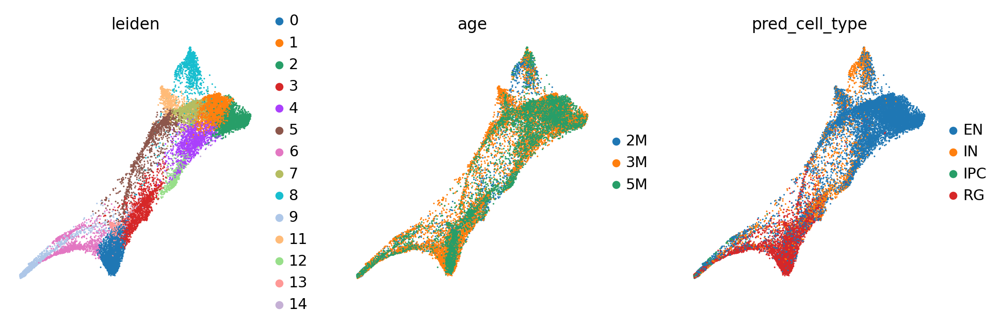

In [8]:
sc.pl.draw_graph(adata, color=['leiden','age','pred_cell_type'], frameon =False)

In [9]:
adata.uns['age_colors'] = ['#dfadb1','#c17f9a','#734274']

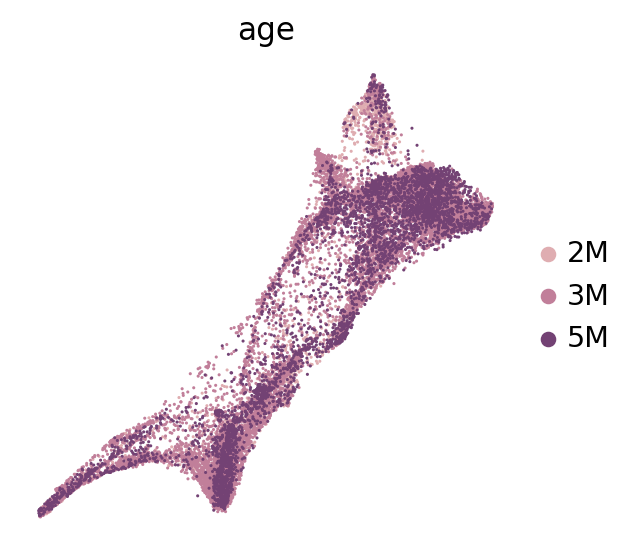

In [10]:
sc.pl.draw_graph(adata, color=['age'], frameon =False)

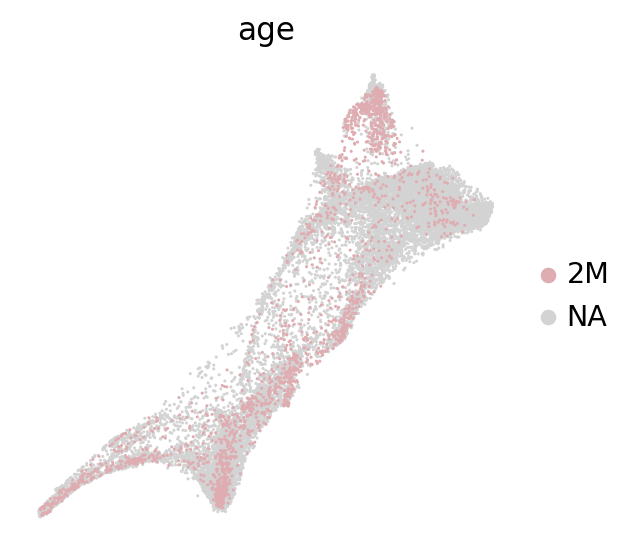

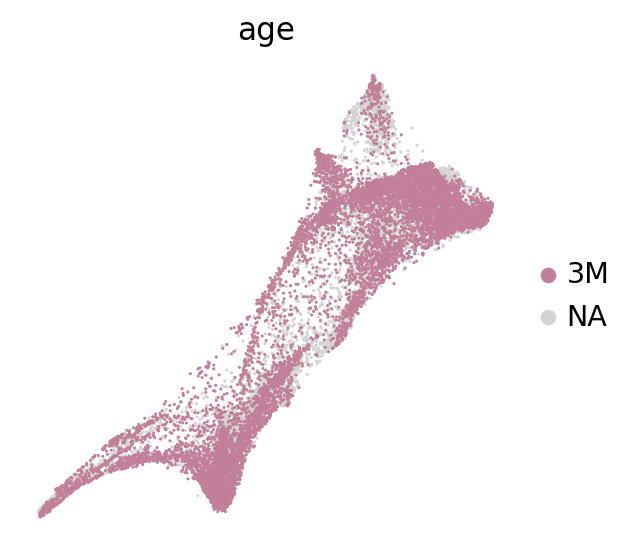

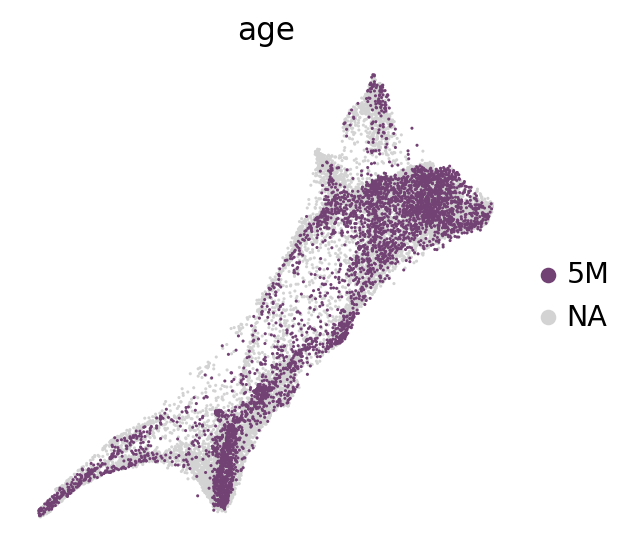

In [11]:
sc.pl.draw_graph(adata, color=['age'],
                 groups = '2M',
                 frameon =False,
                 save='_integrated_M2only.svg'
                )
sc.pl.draw_graph(adata, color=['age'],
                 groups = '3M',
                 frameon =False,
                 save='_integrated_M3only.svg'
                )
sc.pl.draw_graph(adata, color=['age'],
                 groups = '5M',
                 frameon =False,
                 save='_integrated_M5only.svg'
                )

Compute pseudotime

In [12]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['pred_cell_type'].str.startswith(('IPC')))[0]

In [13]:
sc.tl.dpt(adata)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9965369  0.99357456 0.9842048  0.9818443  0.9797519
     0.9746242  0.96929413 0.9672107  0.96303815 0.95697564 0.9546849
     0.9531502  0.9487503  0.94563127]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


In [14]:
scv.set_figure_params('scanpy')  # for beautified visualization

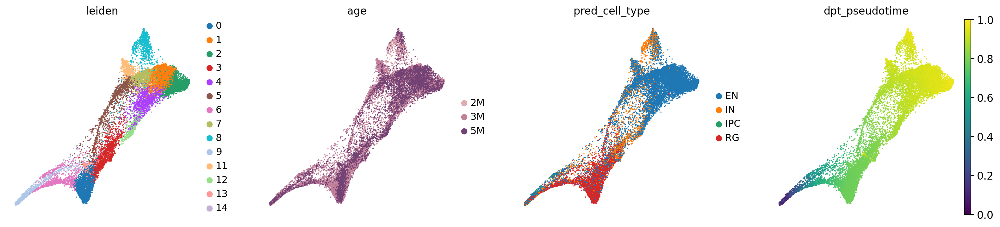

In [15]:
sc.pl.draw_graph(adata, color=['leiden','age','pred_cell_type','dpt_pseudotime'],
                 cmap='viridis',
                 frameon =False,
#                  legend_loc = 'on data',
                save='_integrated.svg'
                )

In [16]:
cell_cycle_genes = [x.strip() for x in open('./regev_lab_cell_cycle_genes.txt')]
print(len(cell_cycle_genes))

# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
print(len(cell_cycle_genes))

97
94


In [17]:
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    601 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    469 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


... storing 'phase' as categorical


computing density on 'draw_graph_fa'
--> added
    'draw_graph_fa_density_phase', densities (adata.obs)
    'draw_graph_fa_density_phase_params', parameter (adata.uns)


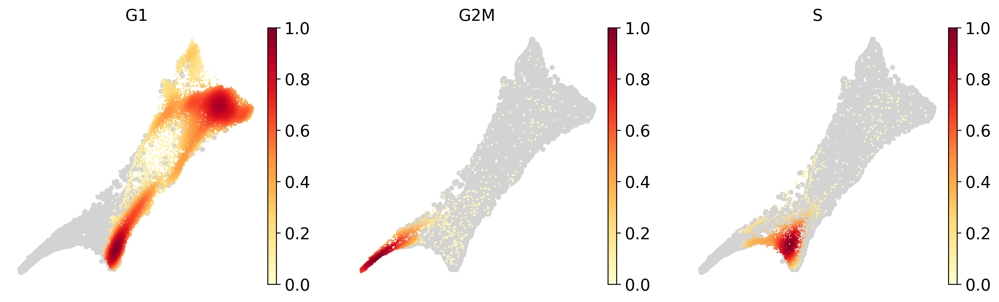

In [18]:
sc.settings.set_figure_params(dpi=150)
sc.tl.embedding_density(adata, basis='draw_graph_fa', groupby='phase')
sc.pl.embedding_density(adata, basis='draw_graph_fa',
                        key='draw_graph_fa_density_phase',
                        save="_intgrated_cell-cycle.svg",
                       fg_dotsize=10,
                       frameon = False
                       )
sc.settings.set_figure_params(dpi=80)

Annotate Clusters

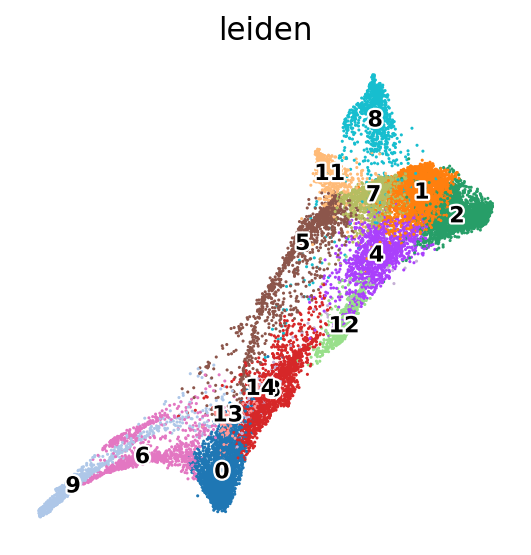

In [19]:
sc.pl.draw_graph(adata, color=['leiden'], legend_loc = "on data", frameon =False,
                 legend_fontsize=10, legend_fontoutline=2,
                 save='_leiden.svg',
)

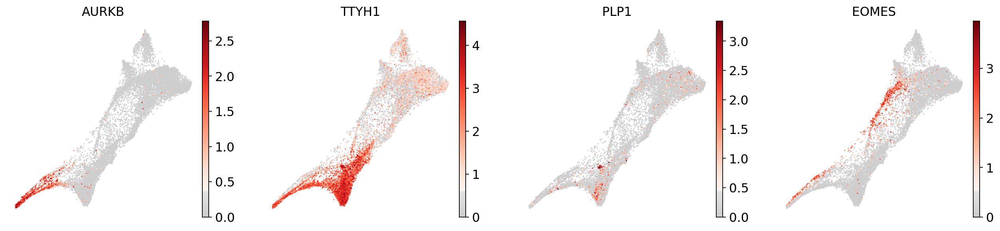

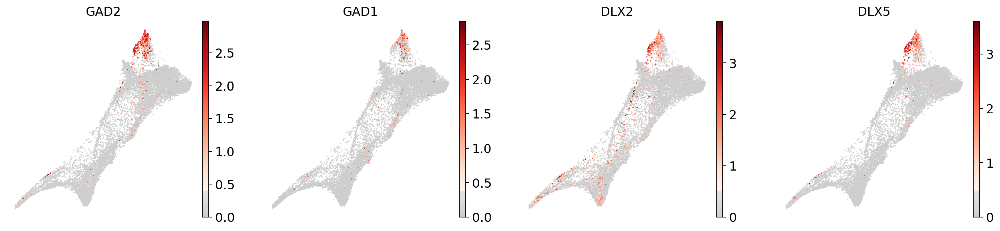

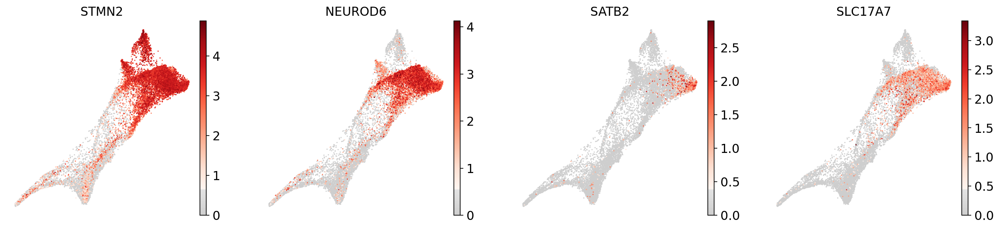

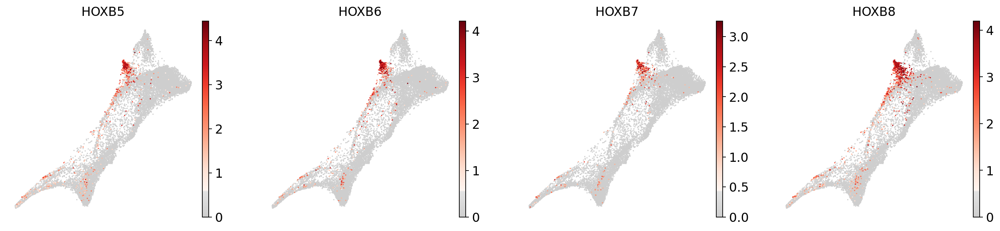

In [20]:
sc.pl.draw_graph(adata, color=['AURKB','TTYH1','PLP1','EOMES'],
                 legend_loc = "on data",
                 frameon =False,
                 legend_fontsize=10,
                 cmap=mymap,
                 legend_fontoutline=2)
sc.pl.draw_graph(adata, color=['GAD2','GAD1','DLX2','DLX5'],
                 legend_loc = "on data",
                 frameon =False,
                 legend_fontsize=10,
                 cmap=mymap,
                 legend_fontoutline=2)
sc.pl.draw_graph(adata, color=['STMN2','NEUROD6','SATB2','SLC17A7'],
                 legend_loc = "on data",
                 frameon =False,
                 legend_fontsize=10,
                 cmap=mymap,
                 legend_fontoutline=2)
sc.pl.draw_graph(adata, color=['HOXB5','HOXB6', 'HOXB7', 'HOXB8'],
                 legend_loc = "on data",
                 frameon =False,
                 legend_fontsize=10,
                 cmap=mymap,
                 legend_fontoutline=2)


In [21]:
adata.obs['cluster_name']=adata.obs['leiden']

In [22]:
new_cluster_names = [
                    'ANP',    #0 Apical neural progenitors
                    'EaN1',    #1 Early neuron 1: NEUROD2
                    'EN1',     #2 Excitatory neuron 1: GRIA2
                    'RG1',     #3 Radial Glia: VIM
                    'EN2',     #4 Excitatory neuron 2: NRXN1
                    'IPC',    #5 Intermediate progenitors Cells: EOMES
                    'proRG1',  #6 proliferating Radial Glia
                    'EaN2',    #7 Early neuron 2: NEUROD6
                    'IN',     #8 Inhibitory neurons: GAD2
                    'proRG2',  #9 proliferating Radial Glia
                    'dev-HB', #11 Developing hindbrain: 'HOXB5','HOXB6', 'HOXB7', 'HOXB8'
                    'dev-N',  #12 Developing neuron
                    'A/O',    #13 Astro/oligodendrocytes: PLP1
                    'RG2',     #14 Radial Glia: VIM

]
adata.rename_categories('cluster_name', new_cluster_names)

In [23]:
adata.obs['cluster_name'] = adata.obs['cluster_name'].str.replace("[0-9]","",regex=True)

... storing 'cluster_name' as categorical


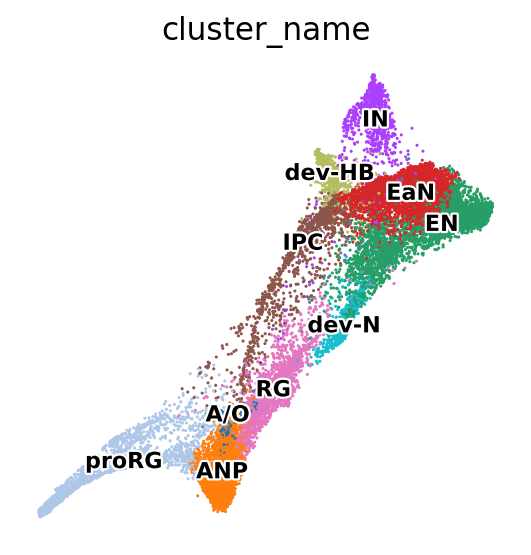

In [24]:
sc.pl.draw_graph(adata, color=['cluster_name'], legend_loc = "on data", frameon =False,
                 legend_fontsize=10, legend_fontoutline=2)

In [25]:
sc.tl.rank_genes_groups(adata, 'cluster_name', method='t-test_overestim_var', key_added='t-test_overestim_var')
sc.tl.rank_genes_groups(adata, 'cluster_name', method='wilcoxon', key_added='wilcoxon')


ranking genes
    finished: added to `.uns['t-test_overestim_var']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)
ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:35)


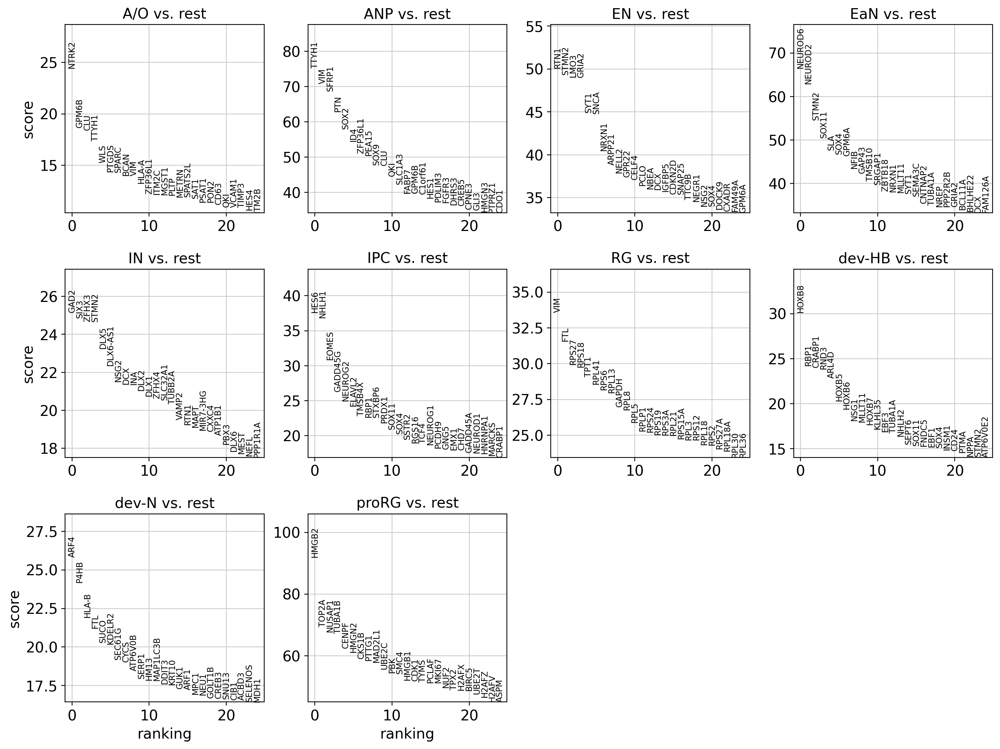

In [26]:
sc.settings.set_figure_params(dpi=100)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key='t-test_overestim_var')
sc.settings.set_figure_params(dpi=80)

In [27]:
import matplotlib as mpl

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cluster_name']`


<Figure size 800x4800 with 0 Axes>

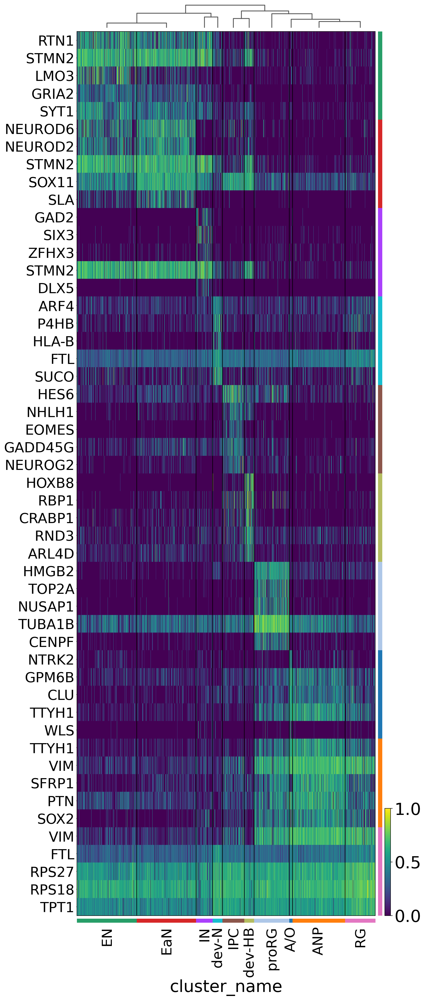

In [28]:
sc.set_figure_params(dpi_save=500, fontsize=30) 
mpl.pyplot.figure(figsize=(10,60))
sc.pl.rank_genes_groups_heatmap(adata,
                                use_raw=True,
                                show_gene_labels=True,
                                groupby='cluster_name',
                                key='t-test_overestim_var',
                                n_genes=5,
                                swap_axes=True,
                                standard_scale='var',
                                cmap='viridis',
#                                 show_gene_labels=True,
                                dendrogram=True, 
                                save='_leiden_swapped.svg',
                                figsize=(10,30)
                               )

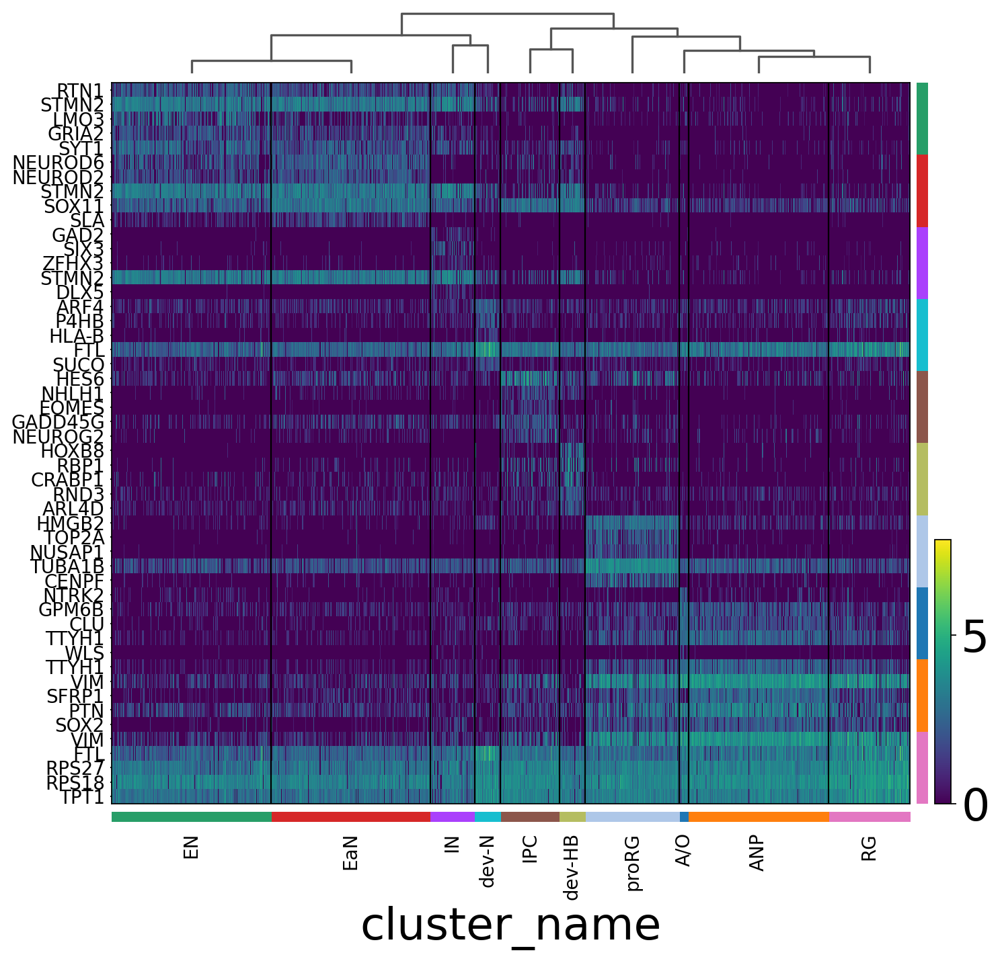

In [29]:
plt.rcParams.update({'font.size': 15})
ax = sc.pl.rank_genes_groups_heatmap(adata, n_genes = 5,
                                            key='t-test_overestim_var',
                                            swap_axes = True,
                                           )


In [30]:
anno_dict = {
'Neuron': ['DCX','MAP2','STMN2'],
'EaN' : ['NEUROD2'],
'Exc': ['SLC17A7','SATB2'],
'Inh': ['GAD2','GAD1','SIX3','DLX6-AS1','DLX1','DLX2','DLX5','ISL1'],
'IPC': ['EOMES',"NHLH1",'EMX1'],
'proRG': ['MKI67', 'CENPF', 'TOP2A', 'NUSAP1'],
'Astrocyte': ['S100B','GFAP','AQP4','ID3','GJA1'],
'Oligo': ['SOX6','NAGLU','GALC','OLIG1','OLIG2','PLP1'],
'Glia': ['TTYH1','SOX2','PAX6','HES1','GLI3'],
}

categories: A/O, ANP, EN, etc.
var_group_labels: Neuron, EaN, Exc, etc.


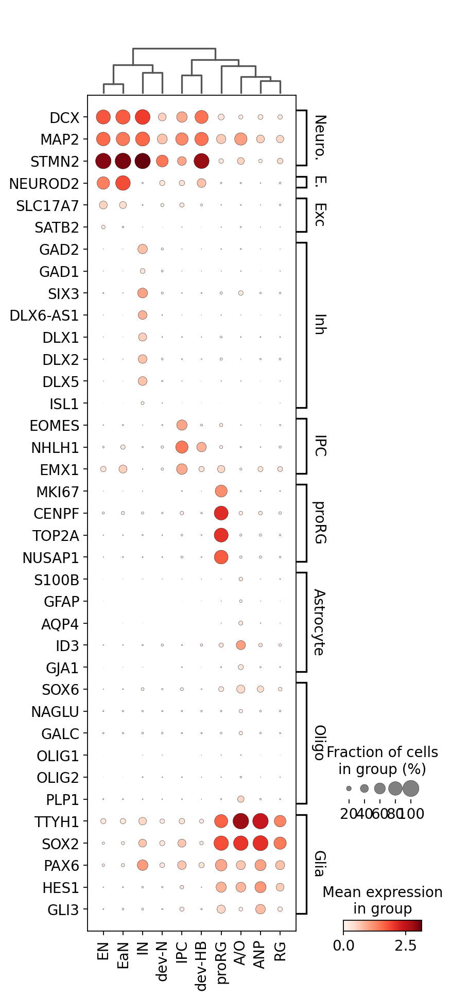

In [31]:
sc.pl.dotplot(adata, anno_dict,
              ['cluster_name'],
              dendrogram=True,
              swap_axes=True,
#               cmap='viridis'
#               rotation= 90
#               cmap=mymap
              save='_anno_markers.svg'
             )


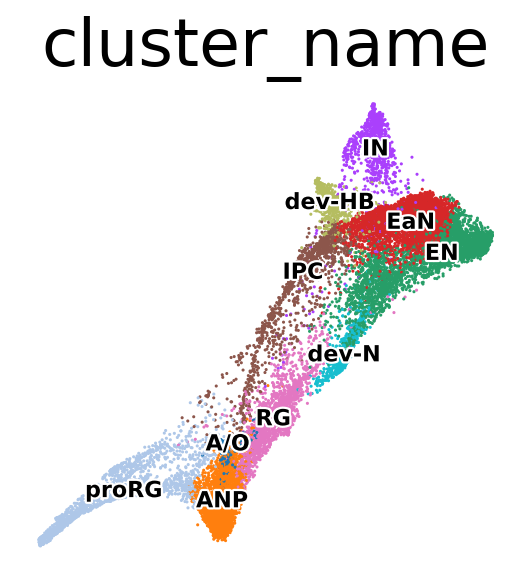

In [32]:
sc.pl.draw_graph(adata, color=['cluster_name'], legend_loc = "on data", frameon =False,
                 legend_fontsize=10, legend_fontoutline=2,
                 save='_cluster_names.svg'
)

In [33]:
############
adata.write('./write/HiQ_final_adata.h5ad')
# adata.write_loom('./write/HiQ_final_adata.loom', write_obsm_varm=True)
############

In [34]:
# adata = sc.read_h5ad('./write/HiQ_final_adata.h5ad')


In [35]:
# ### Write loom file for SCOPE

# # embeddings
# graphDF = pd.DataFrame(adata.obsm['X_draw_graph_fa'], columns=['_X', '_Y'])

# ## Write processed loom for SCope

# row_attrs = {
#     "Gene": np.array(adata.raw.var.index) ,
# }

# col_attrs = {
#     "CellID":  np.array(adata.obs.index) ,
#     "nGene": np.array( np.sum(adata.raw.X.transpose()>0 , axis=0)).flatten() ,
#     "nUMI": np.array( np.sum(adata.raw.X.transpose() , axis=0)).flatten() ,
#     "predictions": np.array( adata.obs['predictions'].values ),
#     "Embedding": dfToNamedMatrix(graphDF),
# }

# lp.create( './write/HiQ_final_adata_SCope.loom',
#            adata.raw.X.transpose(),
#            row_attrs,
#            col_attrs
#          )

Calculate markers on predicted celltype annotation

In [36]:
sc.tl.rank_genes_groups(adata, 'pred_cell_type', method='t-test_overestim_var', key_added='anno_t-test_overestim_var')
sc.tl.rank_genes_groups(adata, 'pred_cell_type', method='wilcoxon', key_added='anno_wilcoxon')


ranking genes
    finished: added to `.uns['anno_t-test_overestim_var']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)
ranking genes
    finished: added to `.uns['anno_wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:53)


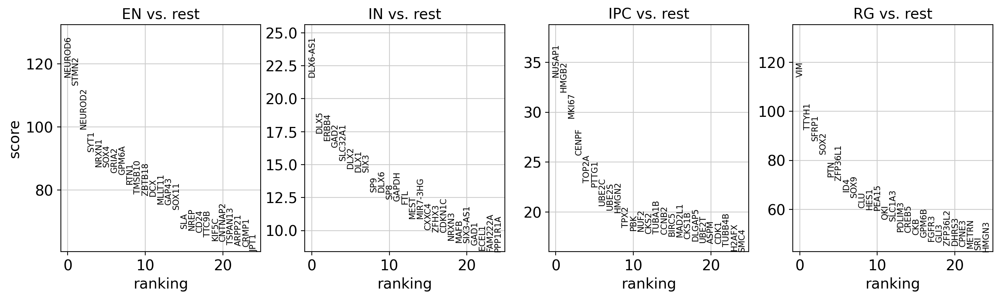

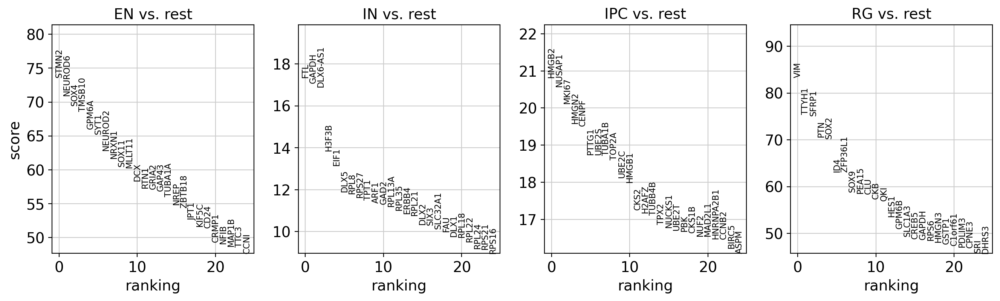

In [37]:
sc.settings.set_figure_params(dpi=100)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key='anno_t-test_overestim_var')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key='anno_wilcoxon')

sc.settings.set_figure_params(dpi=80)

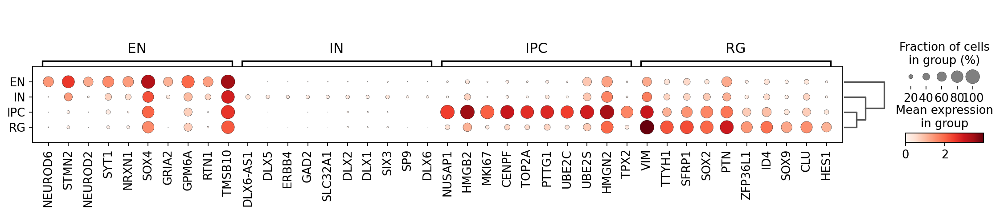

In [38]:
sc.pl.rank_genes_groups_dotplot(adata,
                                key='anno_t-test_overestim_var'
                               )

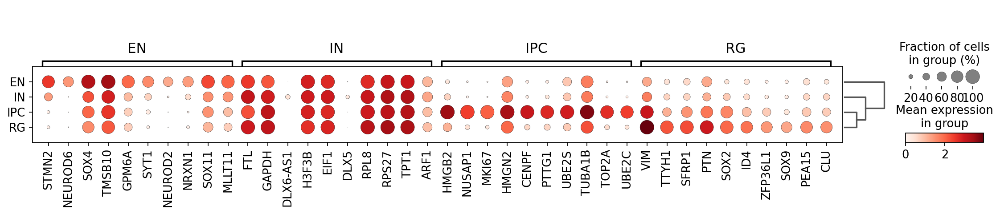

In [39]:
sc.pl.rank_genes_groups_dotplot(adata,
                                key='anno_wilcoxon'
                               )

**Analyze time-points separately**

In [40]:
M2 = adata[adata.obs['age'] == '2M']
M3 = adata[adata.obs['age'] == '3M']
M5 = adata[adata.obs['age'] == '5M']

In [41]:
#  DEFINE CELL-CYCLE GENES
cell_cycle_genes = [x.strip() for x in open('./regev_lab_cell_cycle_genes.txt')]
print(len(cell_cycle_genes))

# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
print(len(cell_cycle_genes))

97
94


**M2**

In [42]:
sc.tl.pca(M2, svd_solver='arpack', n_comps=50)
sc.tl.tsne(M2, n_pcs = 20)
sc.pp.neighbors(M2)
sc.tl.umap(M2)
sc.tl.draw_graph(M2)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing tSNE
    using 'X_pca' with n_pcs = 20
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:07)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:08)


<Figure size 320x320 with 0 Axes>

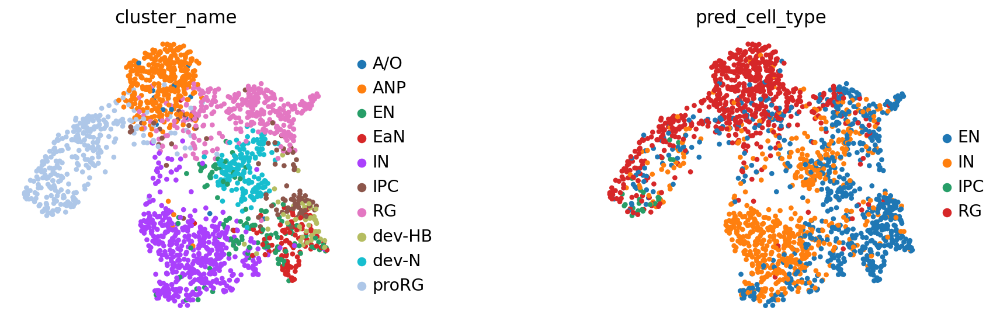

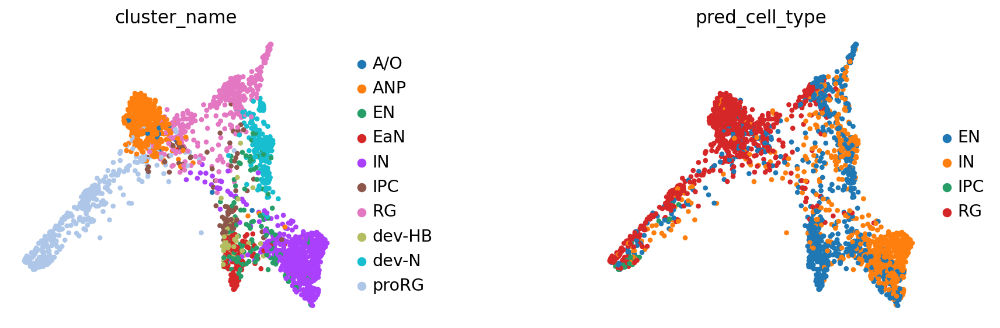

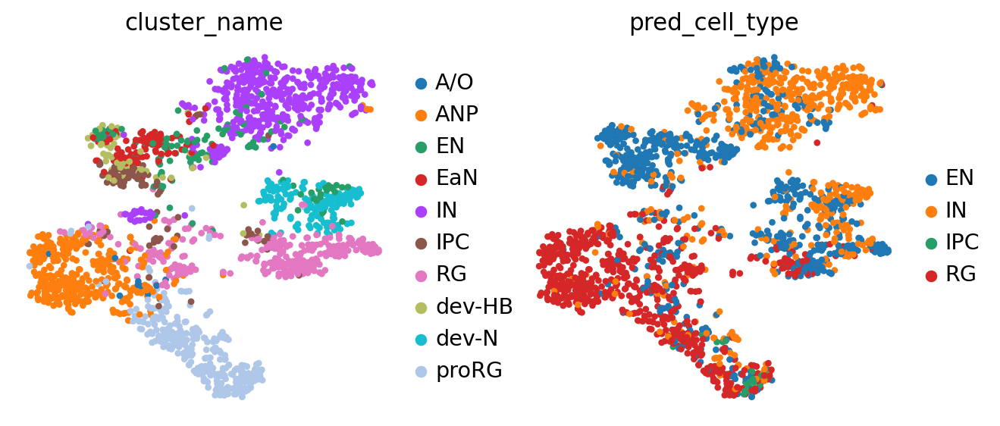

In [43]:
plt.figure()
sc.pl.umap(
    M2,
    color=["cluster_name", "pred_cell_type"],
    frameon=False,
    wspace=0.6,
)
sc.pl.draw_graph(
    M2,
    color=["cluster_name", "pred_cell_type"],
    frameon=False,
    wspace=0.6,
    save='_M2.svg'
)
sc.pl.tsne(M2, color=['cluster_name','pred_cell_type'],frameon=False)

In [44]:
sc.tl.score_genes_cell_cycle(M2, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    601 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    471 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


... storing 'phase' as categorical


computing density on 'draw_graph_fa'
--> added
    'draw_graph_fa_density_phase', densities (adata.obs)
    'draw_graph_fa_density_phase_params', parameter (adata.uns)


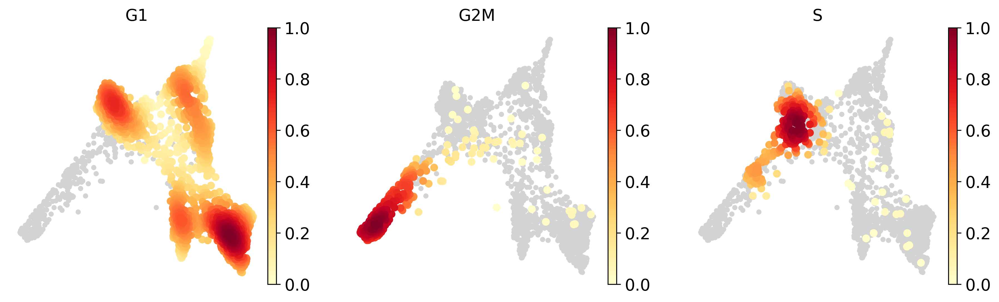

In [45]:
sc.settings.set_figure_params(dpi=150)
sc.tl.embedding_density(M2, basis='draw_graph_fa', groupby='phase')
sc.pl.embedding_density(M2, basis='draw_graph_fa',
                        key='draw_graph_fa_density_phase',
#                        fg_dotsize=20,
                       frameon = False,
                       save='_M2_CC.svg'

                       )
sc.settings.set_figure_params(dpi=80)

**M3**

In [64]:
sc.tl.pca(M3, svd_solver='arpack', n_comps=50)
sc.tl.tsne(M3, n_pcs = 20)
sc.pp.neighbors(M3)
sc.tl.umap(M3)
sc.tl.draw_graph(M3)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 20
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:27)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:25)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:01:19)


<Figure size 320x320 with 0 Axes>

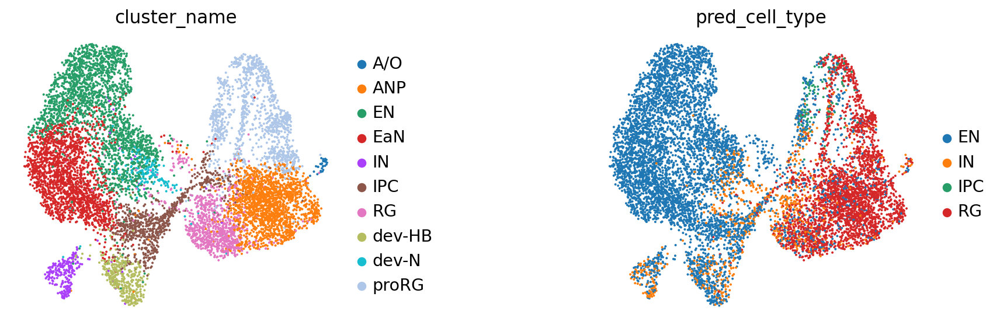

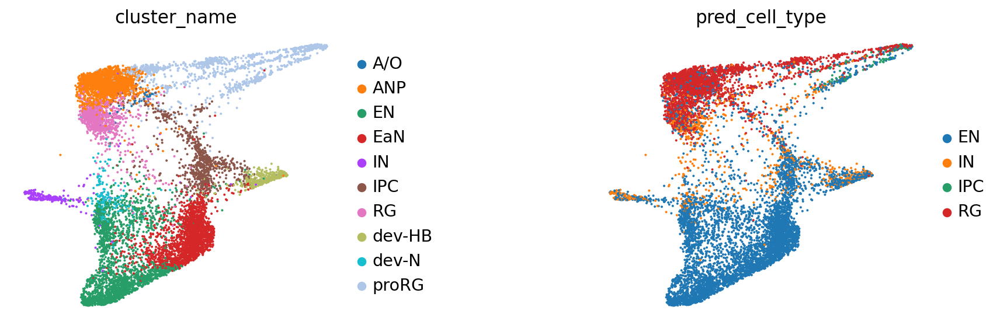

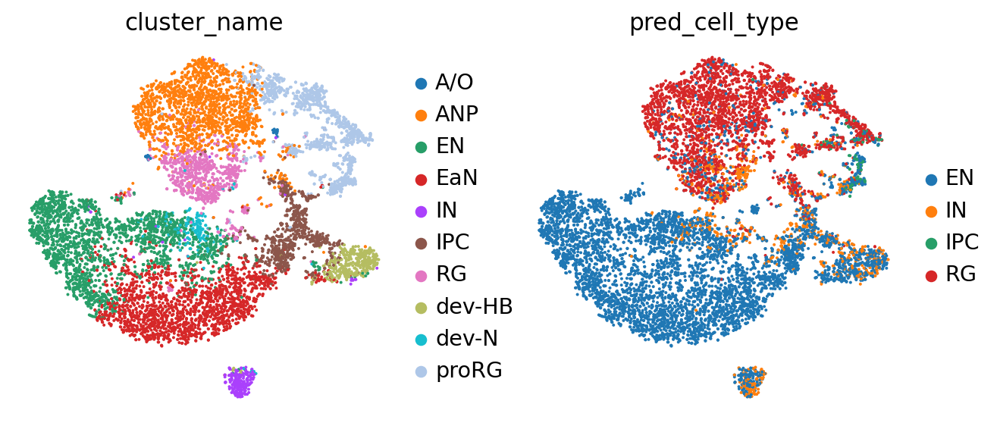

In [65]:
plt.figure()
sc.pl.umap(
    M3,
    color=["cluster_name", "pred_cell_type"],
    frameon=False,
    wspace=0.6,
)
sc.pl.draw_graph(
    M3,
    color=["cluster_name", "pred_cell_type"],
    frameon=False,
    wspace=0.6,
                           save='_M3.svg'

)
sc.pl.tsne(M3, color=['cluster_name','pred_cell_type'],frameon=False)

In [66]:
sc.tl.score_genes_cell_cycle(M3, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    600 total control genes are used. (0:00:02)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    473 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


... storing 'phase' as categorical


computing density on 'draw_graph_fa'
--> added
    'draw_graph_fa_density_phase', densities (adata.obs)
    'draw_graph_fa_density_phase_params', parameter (adata.uns)


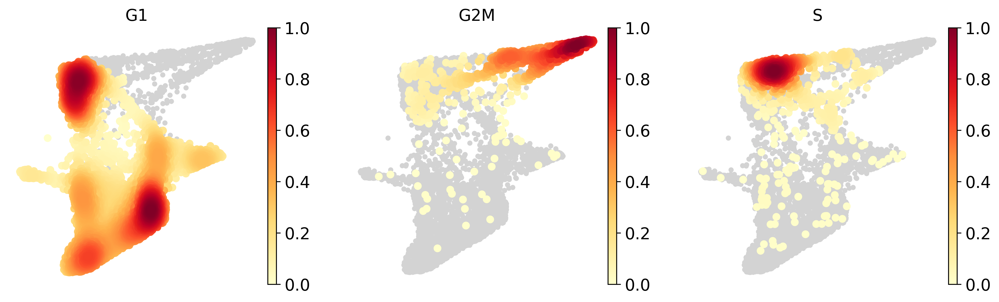

In [67]:
sc.settings.set_figure_params(dpi=150)
sc.tl.embedding_density(M3, basis='draw_graph_fa', groupby='phase')
sc.pl.embedding_density(M3, basis='draw_graph_fa',
                        key='draw_graph_fa_density_phase',
#                        fg_dotsize=20,
                       frameon = False,
                       save='_M3_CC.svg'

                       )
sc.settings.set_figure_params(dpi=80)

**M5**

In [50]:
sc.tl.pca(M5, svd_solver='arpack', n_comps=50)
sc.tl.tsne(M5, n_pcs = 20)
sc.pp.neighbors(M5)
sc.tl.umap(M5)
sc.tl.draw_graph(M5)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing tSNE
    using 'X_pca' with n_pcs = 20
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:13)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:28)


<Figure size 320x320 with 0 Axes>

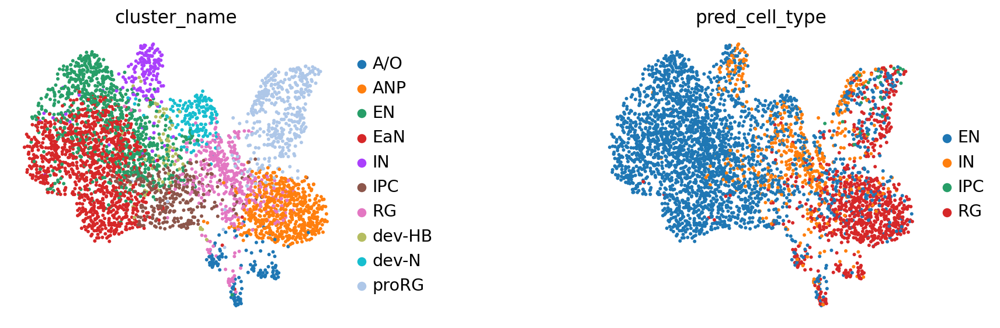

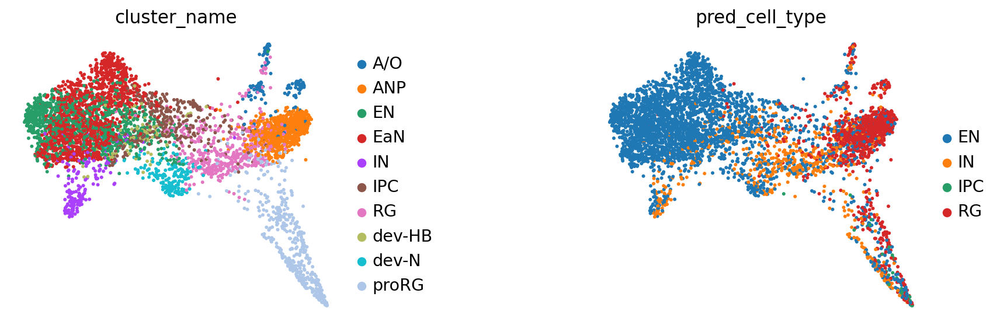

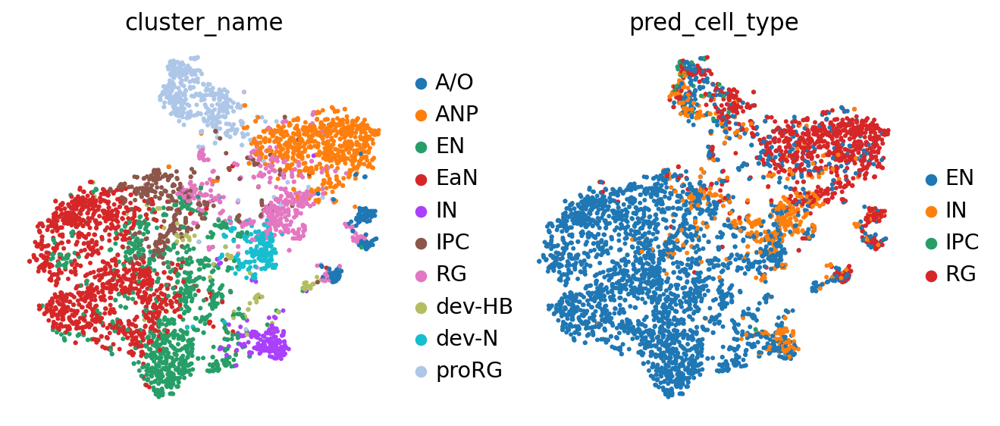

In [51]:
plt.figure()
sc.pl.umap(
    M5,
    color=["cluster_name", "pred_cell_type"],
    frameon=False,
    wspace=0.6,
)
sc.pl.draw_graph(
    M5,
    color=["cluster_name", "pred_cell_type"],
    frameon=False,
    wspace=0.6,
    save='_M5.svg'

)
sc.pl.tsne(M5, color=['cluster_name','pred_cell_type'],frameon=False)

In [52]:
sc.tl.score_genes_cell_cycle(M5, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    645 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    514 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


... storing 'phase' as categorical


computing density on 'draw_graph_fa'
--> added
    'draw_graph_fa_density_phase', densities (adata.obs)
    'draw_graph_fa_density_phase_params', parameter (adata.uns)


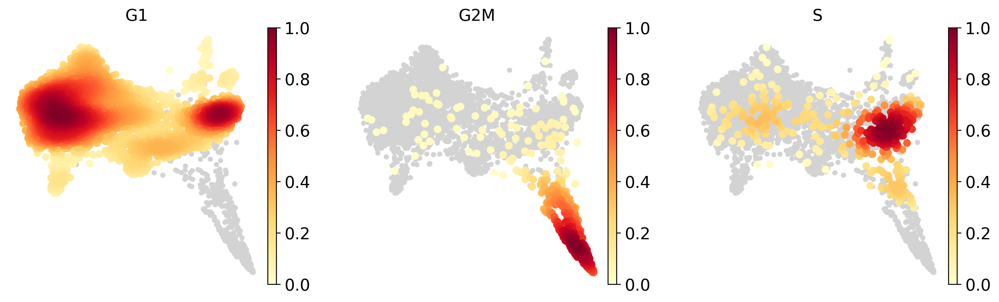

In [53]:
sc.settings.set_figure_params(dpi=150)
sc.tl.embedding_density(M5, basis='draw_graph_fa', groupby='phase')
sc.pl.embedding_density(M5, basis='draw_graph_fa',
                        key='draw_graph_fa_density_phase',
#                        fg_dotsize=20,
                       frameon = False,
                       save='_M5_CC.svg'

                       )
sc.settings.set_figure_params(dpi=80)

In [54]:
M2.write('./write/M2.h5ad')
M3.write('./write/M3.h5ad')
M5.write('./write/M5.h5ad')

In [55]:
# M2.write_loom('./write/M2.loom', write_obsm_varm=True)
# M3.write_loom('./write/M3.loom', write_obsm_varm=True)
# M5.write_loom('./write/M5.loom', write_obsm_varm=True)

In [56]:
# ### Write loom file for SCOPE

# # embeddings
# graphDF = pd.DataFrame(M2.obsm['X_draw_graph_fa'], columns=['_X', '_Y'])

# ## Write processed loom for SCope

# row_attrs = {
#     "Gene": np.array(M2.raw.var.index) ,
# }

# col_attrs = {
#     "CellID":  np.array(M2.obs.index) ,
#     "nGene": np.array( np.sum(M2.raw.X.transpose()>0 , axis=0)).flatten() ,
#     "nUMI": np.array( np.sum(M2.raw.X.transpose() , axis=0)).flatten() ,
#     "pred_cell_type": np.array( M2.obs['pred_cell_type'].values ),
#     "Embedding": dfToNamedMatrix(graphDF),
# }

# lp.create( './write/HiQ_final_M2_SCope.loom',
#            M2.raw.X.transpose(),
#            row_attrs,
#            col_attrs
#          )

In [57]:
# ### Write loom file for SCOPE

# # embeddings
# graphDF = pd.DataFrame(M3.obsm['X_draw_graph_fa'], columns=['_X', '_Y'])

# ## Write processed loom for SCope

# row_attrs = {
#     "Gene": np.array(M3.raw.var.index) ,
# }

# col_attrs = {
#     "CellID":  np.array(M3.obs.index) ,
#     "nGene": np.array( np.sum(M3.raw.X.transpose()>0 , axis=0)).flatten() ,
#     "nUMI": np.array( np.sum(M3.raw.X.transpose() , axis=0)).flatten() ,
#     "pred_cell_type": np.array( M3.obs['pred_cell_type'].values ),
#     "Embedding": dfToNamedMatrix(graphDF),
# }

# lp.create( './write/HiQ_final_M3_SCope.loom',
#            M3.raw.X.transpose(),
#            row_attrs,
#            col_attrs
#          )

In [58]:
# ### Write loom file for SCOPE

# # embeddings
# graphDF = pd.DataFrame(M5.obsm['X_draw_graph_fa'], columns=['_X', '_Y'])

# ## Write processed loom for SCope

# row_attrs = {
#     "Gene": np.array(M5.raw.var.index) ,
# }

# col_attrs = {
#     "CellID":  np.array(M5.obs.index) ,
#     "nGene": np.array( np.sum(M5.raw.X.transpose()>0 , axis=0)).flatten() ,
#     "nUMI": np.array( np.sum(M5.raw.X.transpose() , axis=0)).flatten() ,
#     "pred_cell_type": np.array( M5.obs['pred_cell_type'].values ),
#     "Embedding": dfToNamedMatrix(graphDF),
# }

# lp.create( './write/HiQ_final_M5_SCope.loom',
#            M5.raw.X.transpose(),
#            row_attrs,
#            col_attrs
#          )

In [59]:
# M2 = sc.read_h5ad('./write/M2.h5ad')
# M3 = sc.read_h5ad('./write/M3.h5ad')
# M5 = sc.read_h5ad('./write/M5.h5ad')

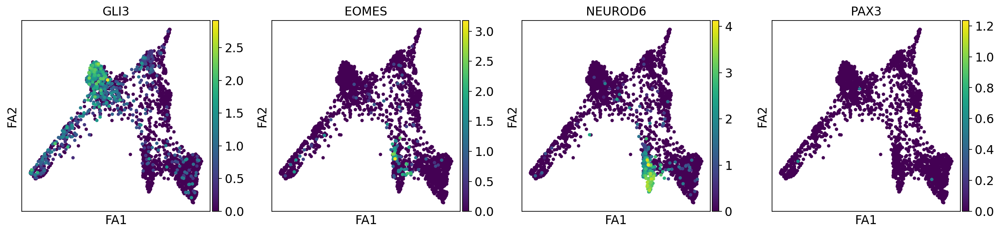

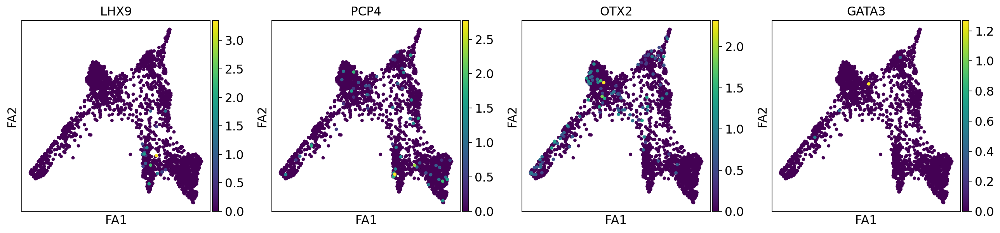

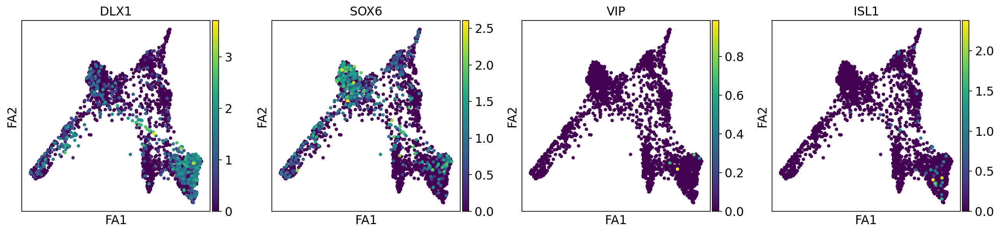

In [60]:
sc.pl.draw_graph(M2, color=['GLI3','EOMES',"NEUROD6","PAX3"])
sc.pl.draw_graph(M2, color=['LHX9','PCP4',"OTX2","GATA3"])
sc.pl.draw_graph(M2, color=['DLX1','SOX6',"VIP","ISL1"])


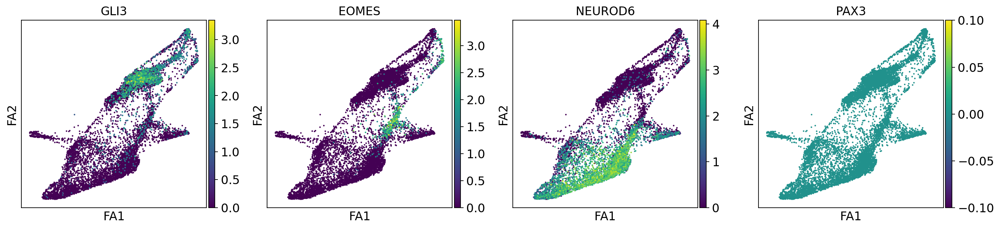

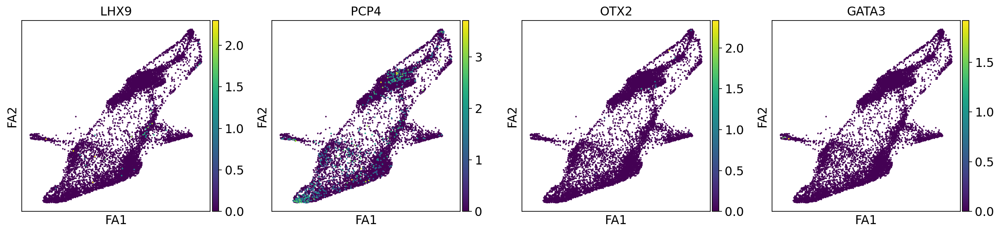

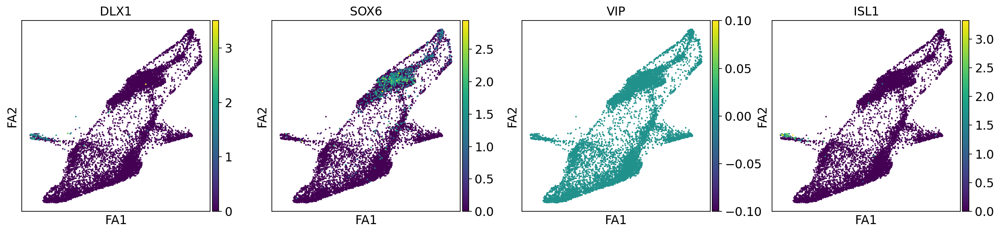

In [61]:
sc.pl.draw_graph(M3, color=['GLI3','EOMES',"NEUROD6","PAX3"])
sc.pl.draw_graph(M3, color=['LHX9','PCP4',"OTX2","GATA3"])
sc.pl.draw_graph(M3, color=['DLX1','SOX6',"VIP","ISL1"])


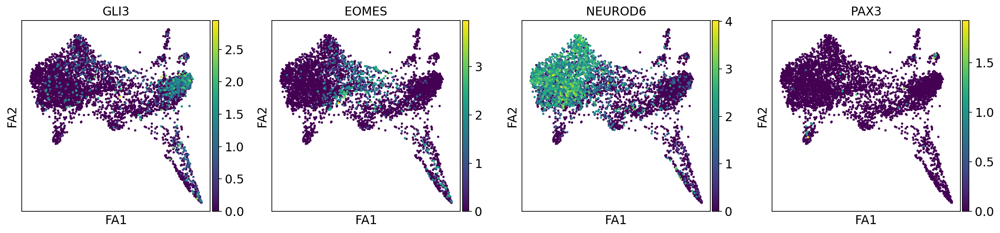

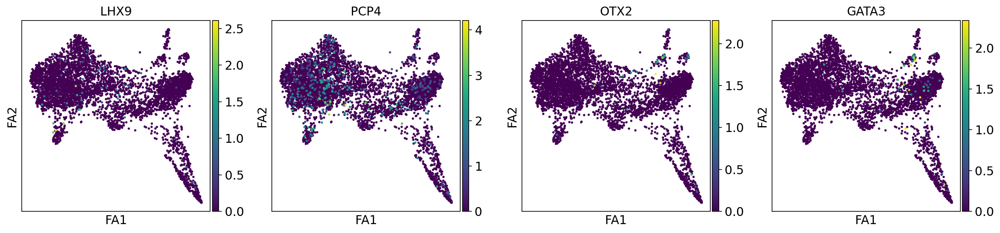

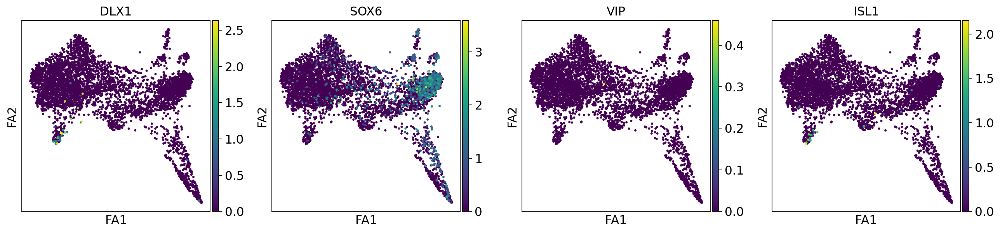

In [62]:
sc.pl.draw_graph(M5, color=['GLI3','EOMES',"NEUROD6","PAX3"])
sc.pl.draw_graph(M5, color=['LHX9','PCP4',"OTX2","GATA3"])
sc.pl.draw_graph(M5, color=['DLX1','SOX6',"VIP","ISL1"])


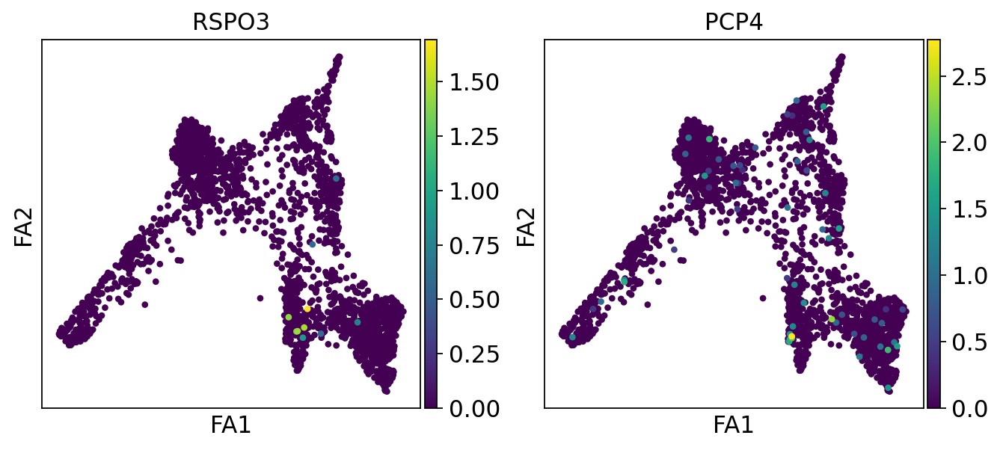

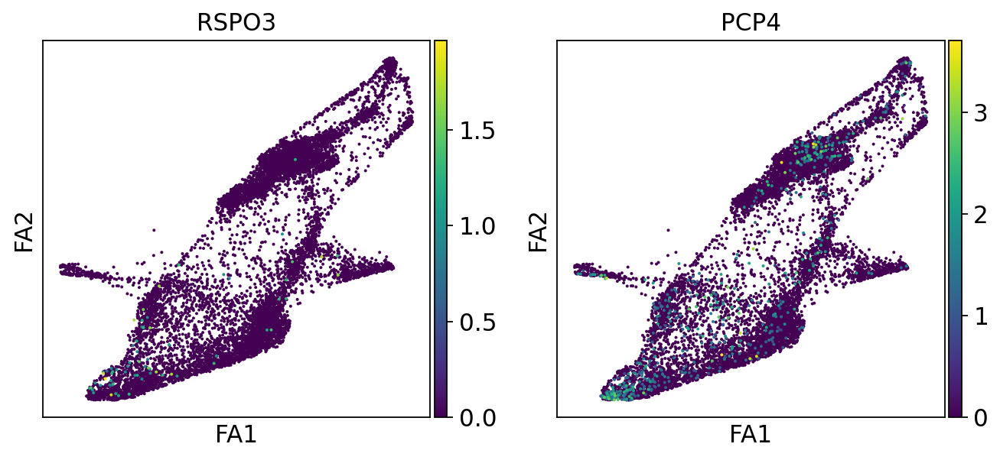

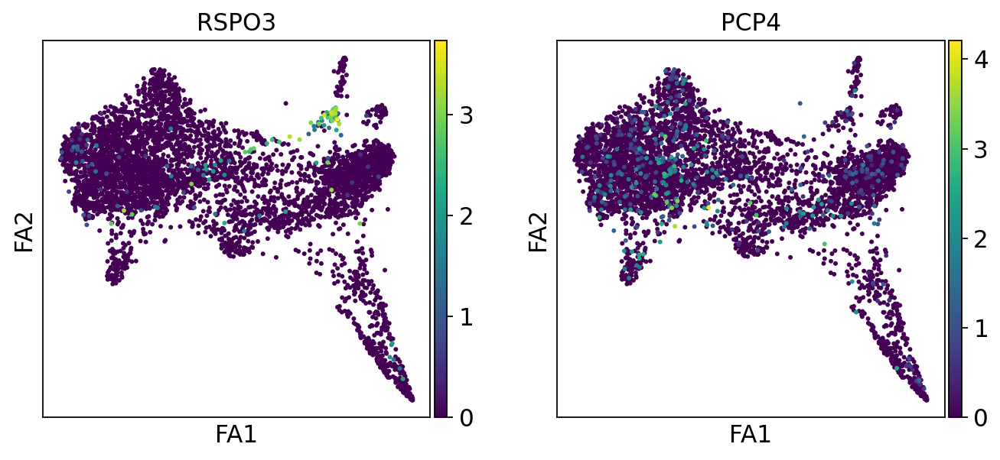

In [63]:
sc.pl.draw_graph(M2, color=['RSPO3','PCP4'])
sc.pl.draw_graph(M3, color=['RSPO3','PCP4'])
sc.pl.draw_graph(M5, color=['RSPO3','PCP4'])
